In [17]:
import numpy as np
import matplotlib.pyplot as plt

%matplotlib inline

# For opening and displaying image
from skimage.data import imread
from skimage.io import imshow

# for convolution and gaussian function
from scipy.signal import gaussian
from scipy.signal import convolve2d

# Detectors
from harris_detector import *
from skimage.feature import corner_harris, corner_peaks

# Transformations
import skimage

In [185]:
plt.rc('text', usetex=True)
plt.rc('font',**{'family':'serif','serif':['Palatino']})

In [228]:
%load_ext autoreload
%autoreload 2
%precision %.5f

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


'%.5f'

In [314]:
# Constant associated with Harris corner detection
kappa = 0.05
sigma_d = 1
sigma_i = 2

# Local window for local minima
local = 1

# Threshold (in percentage of maximal value) for values to keep  after first step of cleaning
threshold = 0.01

# Constants associated with ANMS
c = 0.9
best = 300

In [327]:
def gen_plot(img, save_file = None):
    """
    Given an image, run harris detector points and plot the resulting image
    """
    corners = find_harris_corners(
    img,
    sigma_d,
    sigma_i,
    kappa,
    threshold,
    local
    )
    refined_corners = anms(corners, best, c)
    corners = np.argwhere(corners > 0)
    f, ax = plt.subplots(1,2, figsize = (20, 10));
    ax[0].scatter(corners[:, 1], corners[:, 0], color = 'r', marker= ".", s = 500);
    ax[0].imshow(img, cmap="Greys_r");
    ax[1].scatter(refined_corners[:, 1], refined_corners[:, 0], color = 'r', marker= ".", s = 500);
    ax[1].imshow(img, cmap="Greys_r");
    f.tight_layout();
    ax[0].axis('off')
    ax[1].axis('off')
    if save_file:
        f.savefig("images/" + save_file + ".png")
    print ("Number of corners : {}\nNumber of refined corners : {}".format(len(corners),
                                                                          len(refined_corners)))

# Various scenes

In [328]:
# Constant associated with Harris corner detection
kappa = 0.05
sigma_d = 1
sigma_i = 1

# Local window for local minima
local = 3

# Threshold (in percentage of maximal value) for values to keep  after first step of cleaning
threshold = 0.01

# Constants associated with ANMS
c = 0.7
best = 50


## Bouc

In [329]:
bouc = imread('images/bouc.pgm')

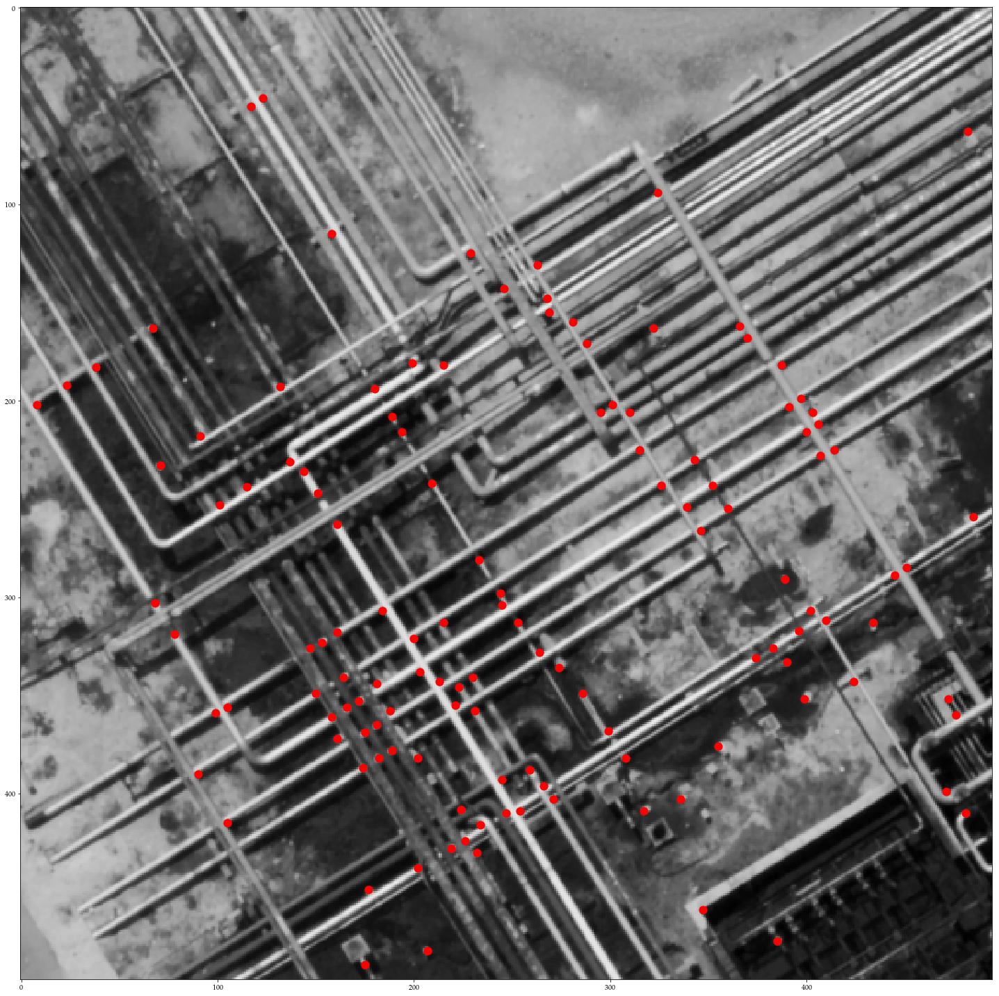

In [330]:
theorical_bouc = corner_peaks(corner_harris(bouc), min_distance = 5);
plt.figure(figsize = (20, 20));
plt.scatter(theorical_bouc[:, 1], theorical_bouc[:, 0], color = 'r', marker= ".", s = 500);
imshow(bouc);

Number of corners : 1265
Number of refined corners : 50


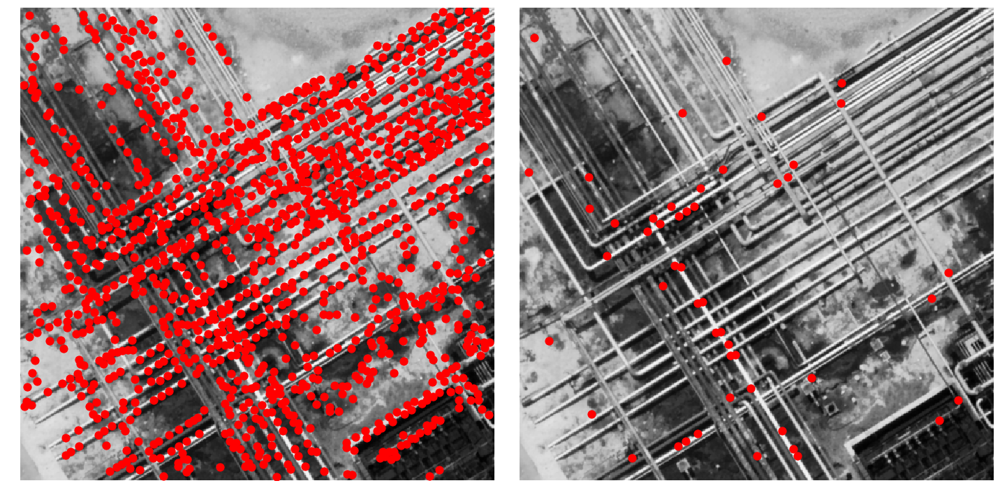

In [331]:
gen_plot(bouc, save_file = "1_bouc")

## Lena

In [332]:
lena = imread('images/lena.pgm')

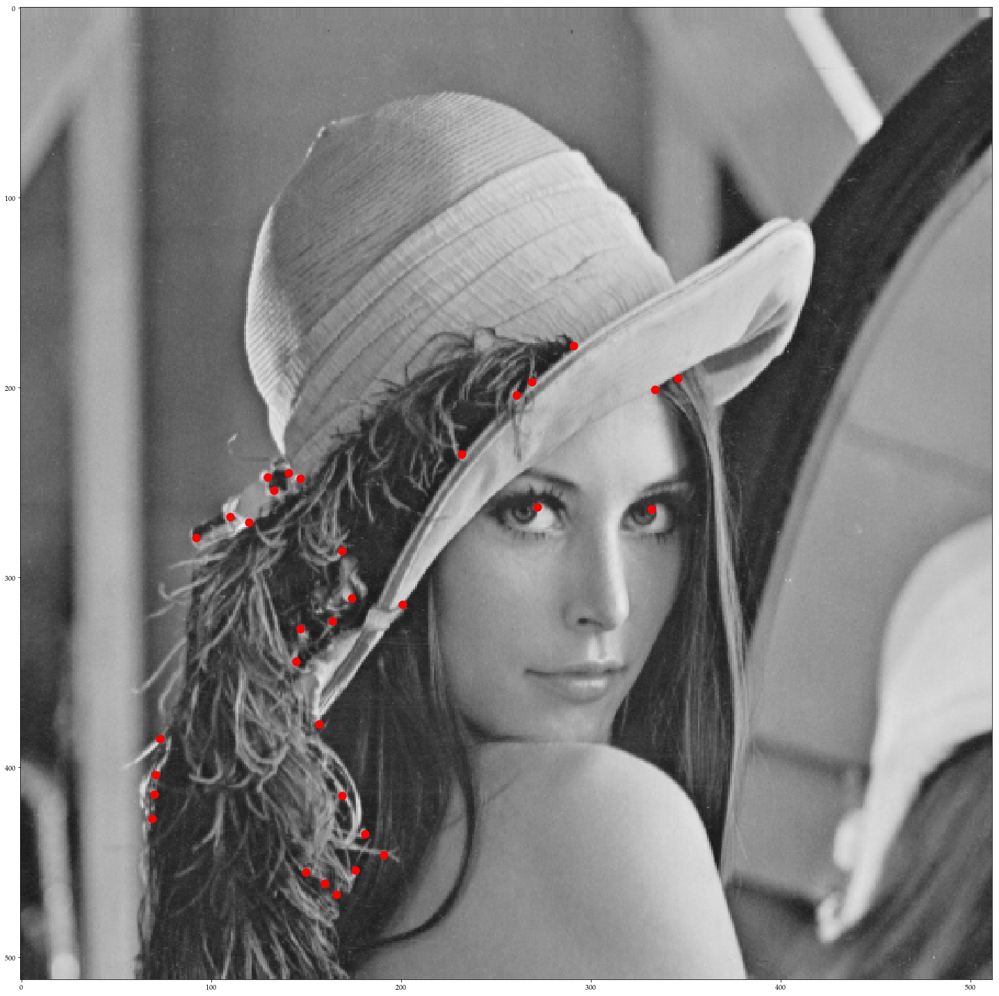

In [333]:
theorical_lena = corner_peaks(corner_harris(lena), min_distance = 5);
plt.figure(figsize = (20, 20));
plt.scatter(theorical_lena[:, 1], theorical_lena[:, 0], color = 'r', marker= ".", s = 500);
imshow(lena);

Number of corners : 326
Number of refined corners : 50


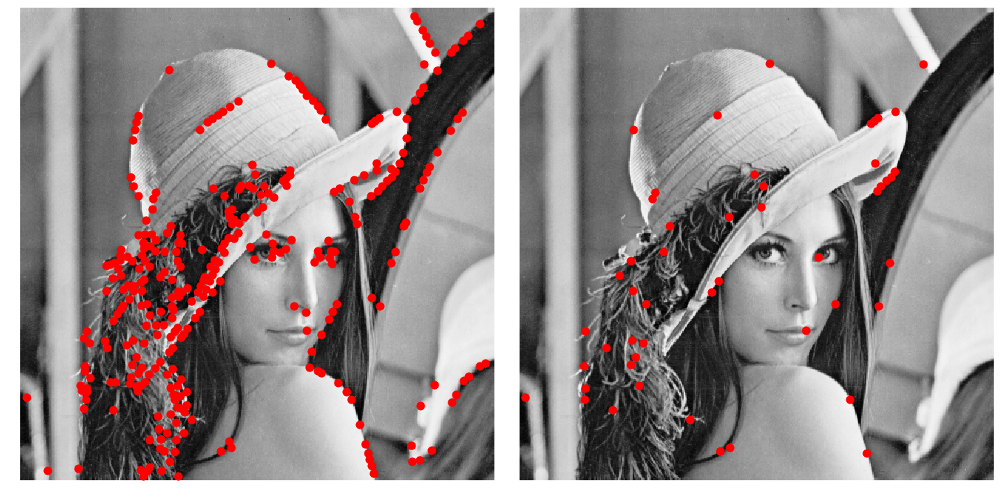

In [334]:
gen_plot(lena, "1_lena")

## Nimes

Number of corners : 390
Number of refined corners : 50


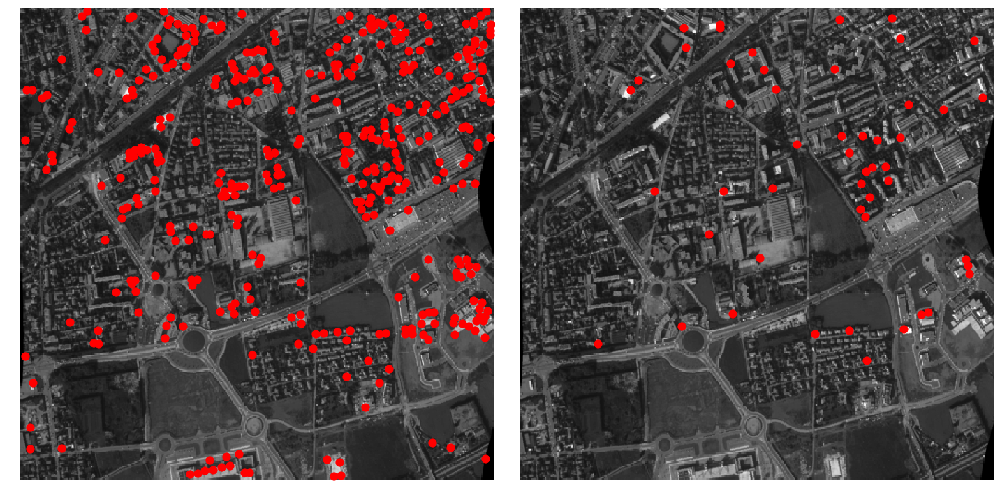

In [335]:
nimes = imread('images/nimes.pgm')
gen_plot(nimes, "1_nimes")

## Cameramn

Number of corners : 156
Number of refined corners : 50


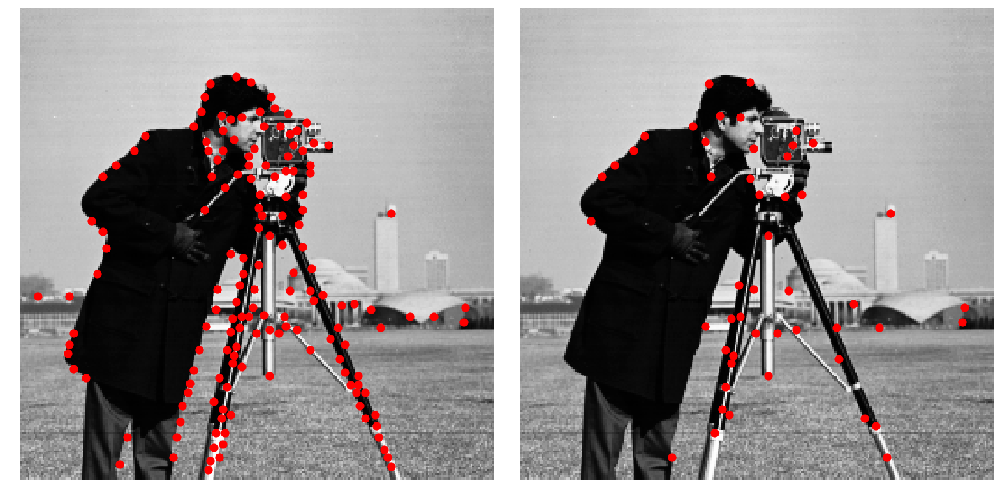

In [336]:
cameraman = imread('images/cameraman.pgm')
gen_plot(cameraman, "1_cameraman")

## Room

Number of corners : 407
Number of refined corners : 50


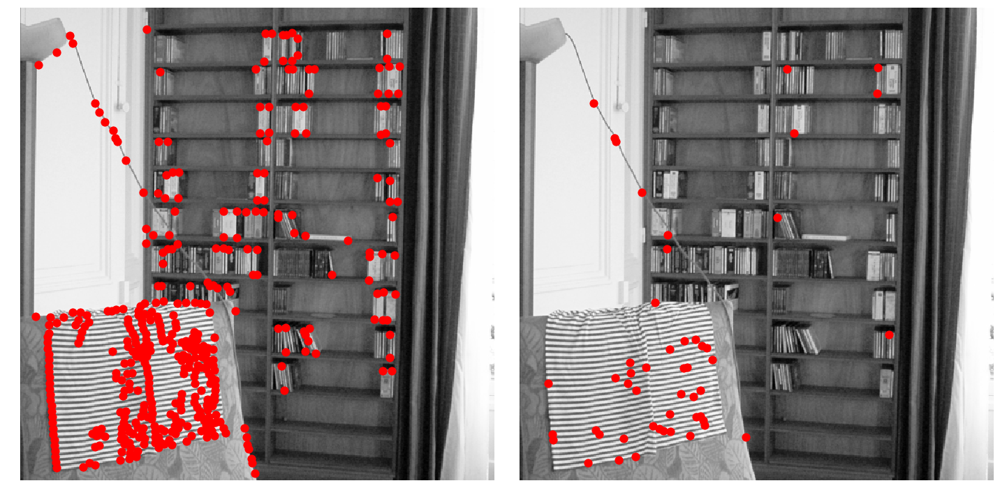

In [337]:
room = imread('images/room.pgm')
gen_plot(room, "1_room")

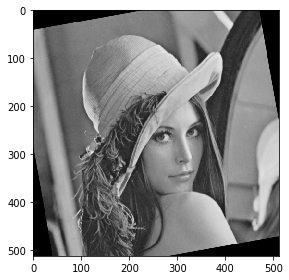

In [52]:
rotated = skimage.transform.rotate(lena, 10)
imshow(rotated);

[[ -7.44643948e-29  -1.74098410e-27  -3.76738298e-26 ...,  -3.00630805e-30
   -1.68473177e-30  -9.25834067e-31]
 [ -1.29959555e-28  -3.00496313e-27  -6.43109628e-26 ...,  -6.50309515e-29
   -3.68556511e-29  -2.04805750e-29]
 [ -2.21913276e-28  -5.07277714e-27  -1.07331715e-25 ...,  -1.30189053e-27
   -7.46181356e-28  -4.19292845e-28]
 ..., 
 [ -7.80796156e-27  -1.38777166e-26  -2.42624892e-26 ...,  -6.56008704e-25
   -3.50711117e-26  -1.73523048e-27]
 [ -4.02633590e-28  -7.24061822e-28  -1.28126567e-27 ...,  -3.87627033e-25
   -2.04812153e-26  -1.00151488e-27]
 [ -1.92162369e-29  -3.49656056e-29  -6.26270589e-29 ...,  -2.25457913e-25
   -1.17758648e-26  -5.69199277e-28]]
Number of corners : 105
Number of refined corners : 50


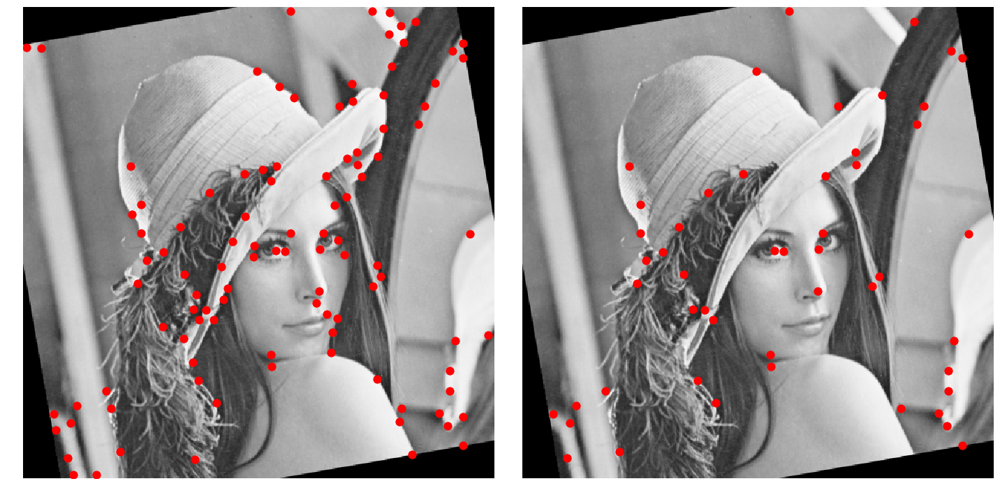

In [58]:
gen_plot(skimage.transform.rotate(lena, 10), "1_lena_rotated_100")

## Différents paramètres

In [69]:
cameraman = imread('images/cameraman.pgm')

In [124]:
# Constant associated with Harris corner detection
kappa = 1
sigma_d = 1
sigma_i = 1

# Local window for local minima
local = 3

# Threshold (in percentage of maximal value) for values to keep  after first step of cleaning
threshold = 0.01

# Constants associated with ANMS
c = 0.7
best = 50

Number of corners : 0
Number of refined corners : 1


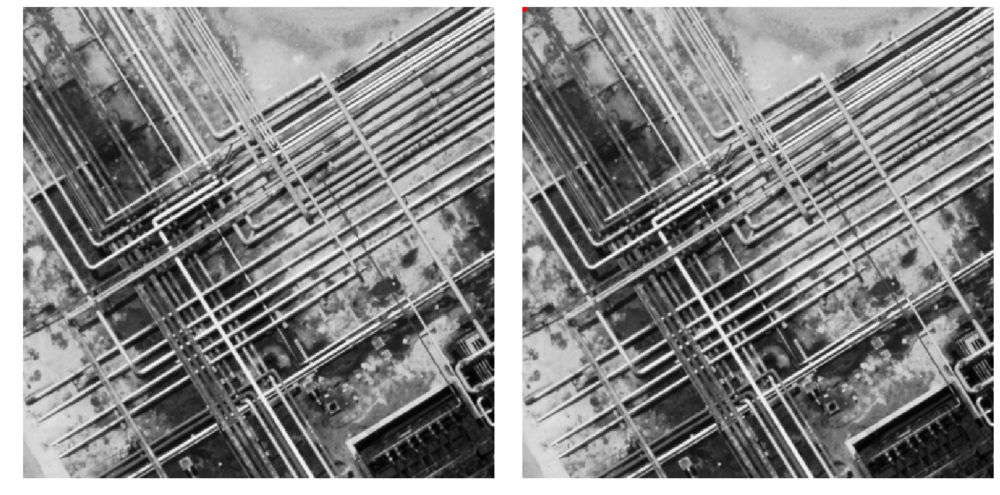

In [125]:
gen_plot(bouc)

In [130]:
# Constant associated with Harris corner detection
kappa = 0.05
sigma_d = 10
sigma_i = 1

# Local window for local minima
local = 3

# Threshold (in percentage of maximal value) for values to keep  after first step of cleaning
threshold = 0.01

# Constants associated with ANMS
c = 0.7
best = 50

## Influence de $\sigma_d$

In [198]:
def gen_plot_sd(img, save_file = None):
    """
    Given an image, run harris detector points and plot the resulting image
    """
    h = 3
    w = 3
    f, ax = plt.subplots(3, 3, figsize = (30, 30));

    R = [1, 3, 5, 10, 15, 20, 50, 70, 90]
    for s in range(9):
        corners = find_harris_corners(
        img,
        R[s],
        sigma_i,
        kappa,
        threshold,
        local
        )
#         refined_corners = anms(corners, best)
        corners = np.argwhere(corners > 0)
        ax[s // h][s % w].scatter(corners[:, 1], corners[:, 0], color = 'r', marker= ".", s = 500);
        ax[s // h][s % w].imshow(img, cmap="Greys_r");
        ax[s // h][s % w].axis('off')
        ax[s // h][s % w].set_title(r'{} corners for $\sigma_d =$ {}'.format(len(corners), R[s]),
                                   fontsize = 40)
    f.tight_layout();
    if save_file:
        f.savefig("images/" + save_file + ".png")

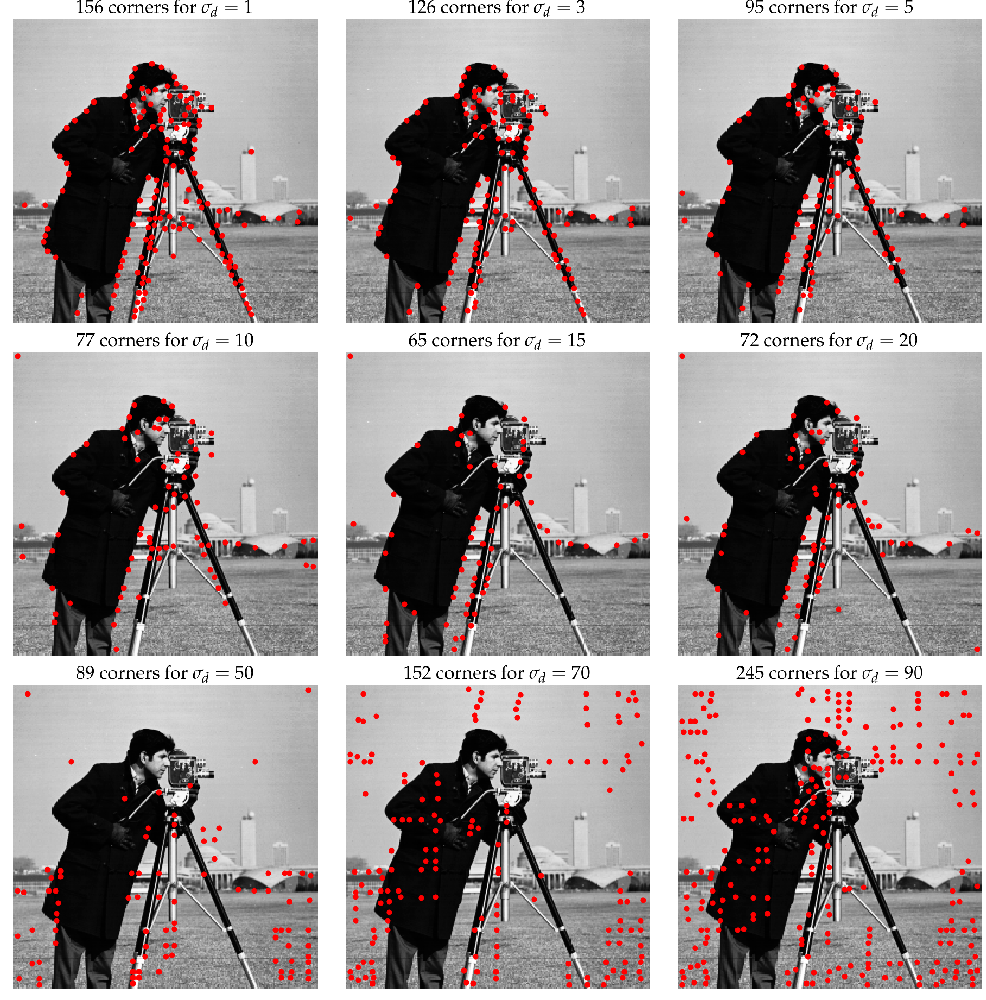

In [199]:
gen_plot_sd(cameraman, save_file = "2_cameraman_sd")

## Influence de $\sigma_i$

In [192]:
# Constant associated with Harris corner detection
kappa = 0.05
sigma_d = 1
sigma_i = 1

# Local window for local minima
local = 3

# Threshold (in percentage of maximal value) for values to keep  after first step of cleaning
threshold = 0.01

# Constants associated with ANMS
c = 0.7
best = 50

In [196]:
def gen_plot_si(img, save_file = None):
    """
    Given an image, run harris detector points and plot the resulting image
    """
    h = 3
    w = 3
    f, ax = plt.subplots(3, 3, figsize = (30, 30));

    R = [1, 3, 5, 10, 15, 20, 50, 70, 90]
    for s in range(9):
        corners = find_harris_corners(
        img,
        sigma_d,
        R[s],
        kappa,
        threshold,
        local
        )
#         refined_corners = anms(corners, best)
        corners = np.argwhere(corners > 0)
        ax[s // h][s % w].scatter(corners[:, 1], corners[:, 0], color = 'r', marker= ".", s = 500);
        ax[s // h][s % w].imshow(img, cmap="Greys_r");
        ax[s // h][s % w].axis('off')
        ax[s // h][s % w].set_title(r'{} corners for $\sigma_i =$ {}'.format(len(corners), R[s]),
                                   fontsize = 40)
    f.tight_layout();
    if save_file:
        f.savefig("images/" + save_file + ".png")

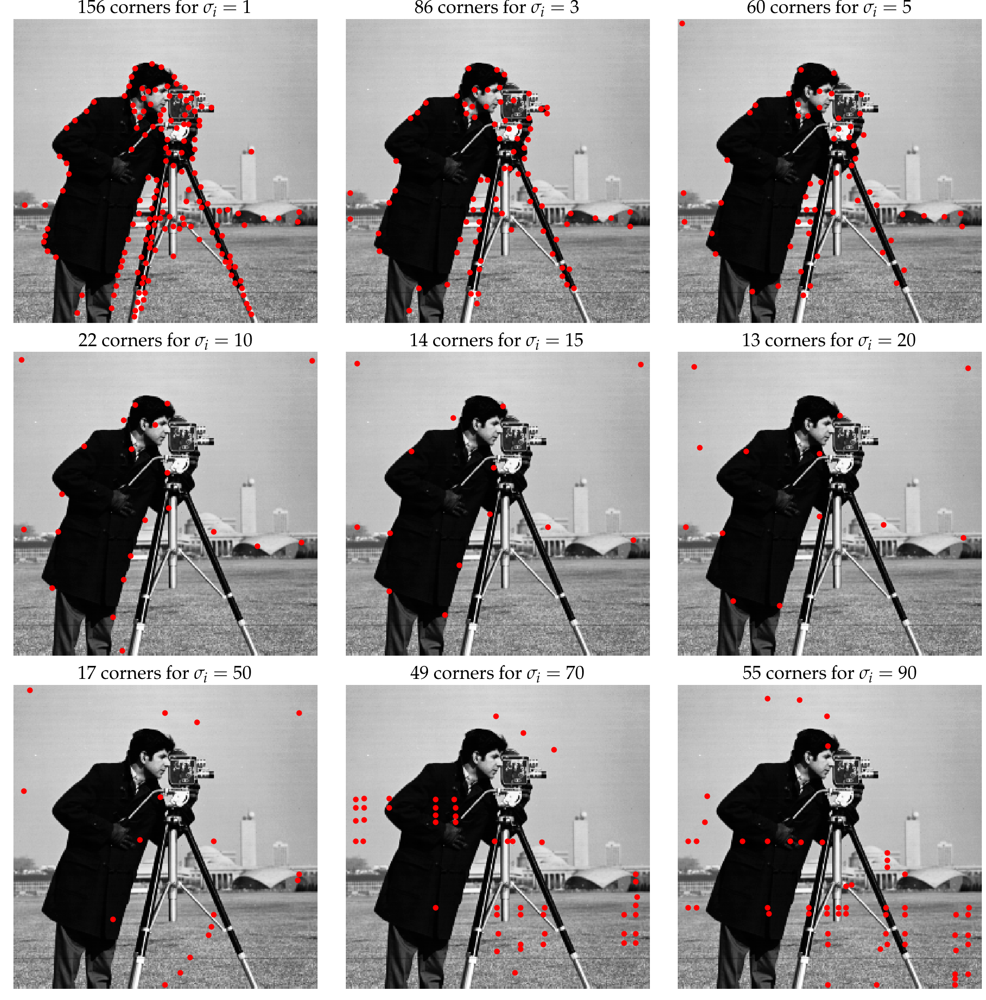

In [197]:
gen_plot_si(cameraman, save_file = "2_cameraman_si")

## Influence de $\kappa$

In [ ]:
# Constant associated with Harris corner detection
kappa = 0.05
sigma_d = 1
sigma_i = 1

# Local window for local minima
local = 3

# Threshold (in percentage of maximal value) for values to keep  after first step of cleaning
threshold = 0.01

# Constants associated with ANMS
c = 0.7
best = 50

In [210]:
def gen_plot_k(img, save_file = None):
    """
    Given an image, run harris detector points and plot the resulting image
    """
    h = 3
    w = 3
    f, ax = plt.subplots(3, 3, figsize = (30, 30));

    R = 0.04 * np.arange(9)
    for s in range(9):
        corners = find_harris_corners(
        img,
        sigma_d,
        sigma_i,
        R[s],
        threshold,
        local
        )
#         refined_corners = anms(corners, best)
        corners = np.argwhere(corners > 0)
        ax[s // h][s % w].scatter(corners[:, 1], corners[:, 0], color = 'r', marker= ".", s = 500);
        ax[s // h][s % w].imshow(img, cmap="Greys_r");
        ax[s // h][s % w].axis('off')
        ax[s // h][s % w].set_title(r'{} corners for $\kappa =$ {}'.format(len(corners), R[s]),
                                   fontsize = 40)
    f.tight_layout();
    if save_file:
        f.savefig("images/" + save_file + ".png")

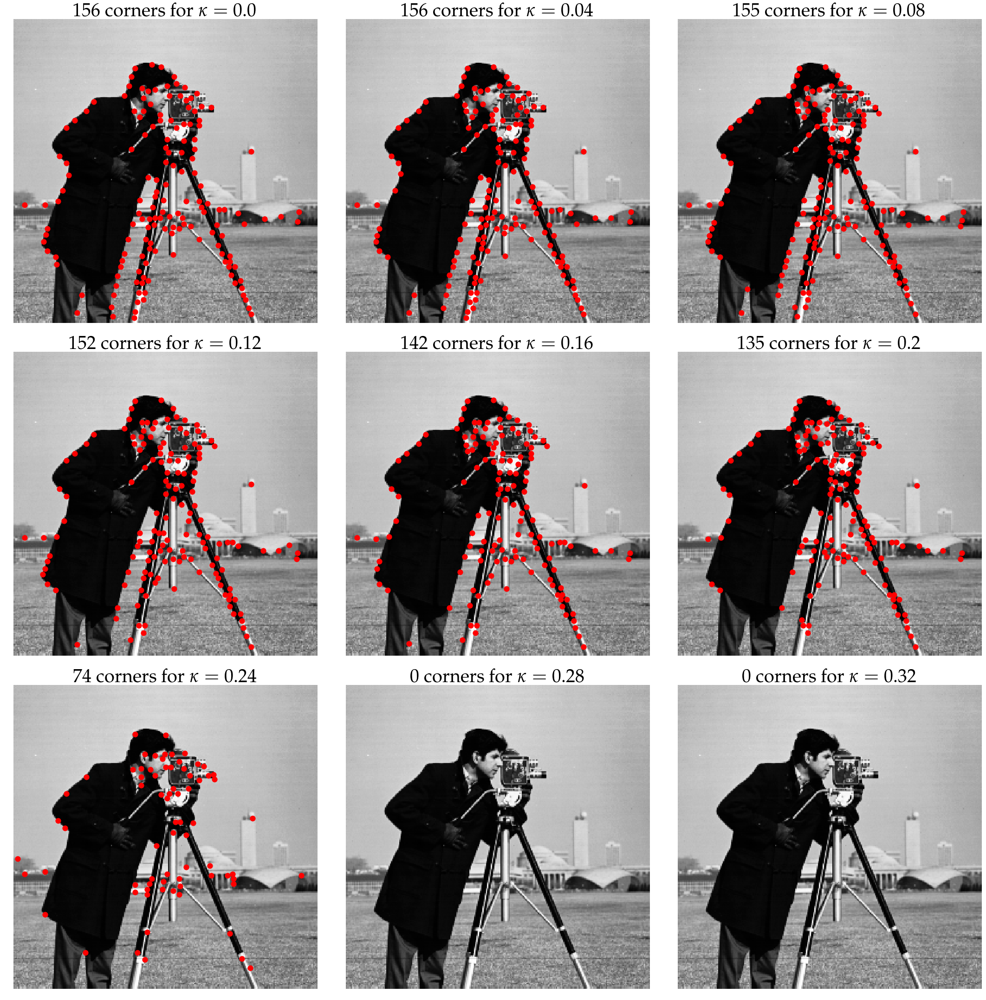

In [211]:
gen_plot_k(cameraman, save_file = "2_cameraman_kappa")

## Influence du $threshold$

In [239]:
# Constant associated with Harris corner detection
kappa = 0.05
sigma_d = 1
sigma_i = 1

# Local window for local minima
local = 3

# Threshold (in percentage of maximal value) for values to keep  after first step of cleaning
threshold = 0.01

# Constants associated with ANMS
c = 0.7
best = 50

def gen_plot_t(img, save_file = None):
    """
    Given an image, run harris detector points and plot the resulting image
    """
    h = 3
    w = 3
    f, ax = plt.subplots(3, 3, figsize = (30, 30));

    R = 0.1 * np.arange(9)
    for s in range(9):
        corners = find_harris_corners(
        img,
        sigma_d,
        sigma_i,
        kappa,
        R[s],
        local
        )
#         refined_corners = anms(corners, best)
        corners = np.argwhere(corners > 0)
        ax[s // h][s % w].scatter(corners[:, 1], corners[:, 0], color = 'r', marker= ".", s = 500);
        ax[s // h][s % w].imshow(img, cmap="Greys_r");
        ax[s // h][s % w].axis('off')
        ax[s // h][s % w].set_title(r'{} corners for $threshold =$ {:2.2}'.format(len(corners), R[s]),
                                   fontsize = 40)
    f.tight_layout();
    if save_file:
        f.savefig("images/" + save_file + ".png")


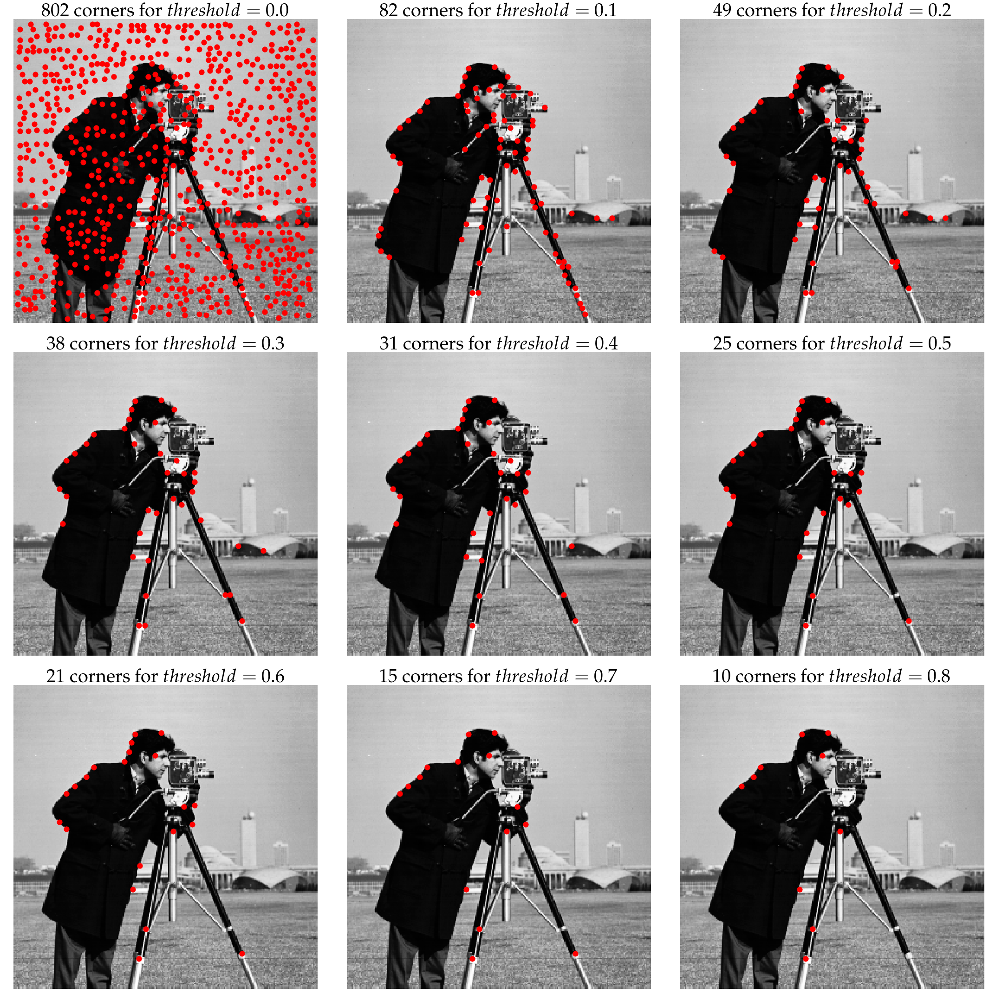

In [240]:
gen_plot_t(cameraman, save_file = "2_cameraman_threshold")

## Influence de $local$

In [246]:
# Constant associated with Harris corner detection
kappa = 0.05
sigma_d = 1
sigma_i = 1

# Local window for local minima
local = 3

# Threshold (in percentage of maximal value) for values to keep  after first step of cleaning
threshold = 0.01

# Constants associated with ANMS
c = 0.7
best = 50

def gen_plot_l(img, save_file = None):
    """
    Given an image, run harris detector points and plot the resulting image
    """
    h = 3
    w = 3
    f, ax = plt.subplots(3, 3, figsize = (30, 30));

    R = np.arange(9)
    for s in range(9):
        corners = find_harris_corners(
        img,
        sigma_d,
        sigma_i,
        kappa,
        threshold,
        R[s]
        )
#         refined_corners = anms(corners, best)
        corners = np.argwhere(corners > 0)
        ax[s // h][s % w].scatter(corners[:, 1], corners[:, 0], color = 'r', marker= ".", s = 500);
        ax[s // h][s % w].imshow(img, cmap="Greys_r");
        ax[s // h][s % w].axis('off')
        ax[s // h][s % w].set_title(r'{} corners for $local =$ {}'.format(len(corners), R[s]),
                                   fontsize = 40)
    f.tight_layout();
    if save_file:
        f.savefig("images/" + save_file + ".png")


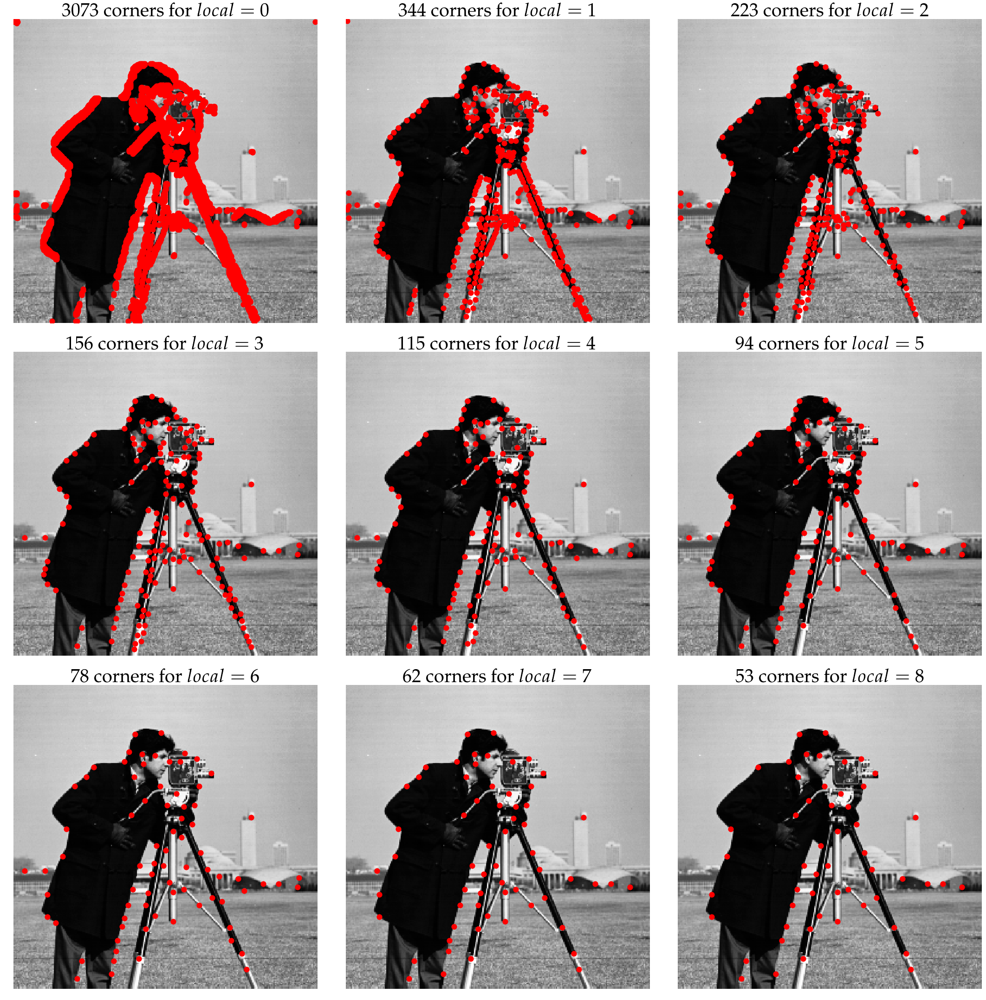

In [254]:
gen_plot_l(cameraman, save_file = "2_cameraman_local")

## Influence de c

In [290]:
# Constant associated with Harris corner detection
kappa = 0.05
sigma_d = 1
sigma_i = 1

# Local window for local minima
local = 3

# Threshold (in percentage of maximal value) for values to keep  after first step of cleaning
threshold = 0.01

# Constants associated with ANMS
c = 0.7
best = 50

def gen_plot_c(img, save_file = None):
    """
    Given an image, run harris detector points and plot the resulting image
    """
    h = 3
    w = 3
    f, ax = plt.subplots(3, 3, figsize = (30, 30));

    R = 0.1 * np.arange(1,10)
    for s in range(9):
        corners = find_harris_corners(
        img,
        sigma_d,
        sigma_i,
        kappa,
        threshold,
        local
        )
#         corners = np.argwhere(corners > 0)
        refined_corners = anms(corners, best, R[s])
        ax[s // h][s % w].scatter(refined_corners[:, 1], refined_corners[:, 0], color = 'r', marker= ".", s = 500);
        ax[s // h][s % w].imshow(img, cmap="Greys_r");
        ax[s // h][s % w].axis('off')
        ax[s // h][s % w].set_title(r'{} corners for $c =$ {:1.1}'.format(len(refined_corners), R[s]),
                                   fontsize = 40)
    f.tight_layout();
    if save_file:
        f.savefig("images/" + save_file + ".png")


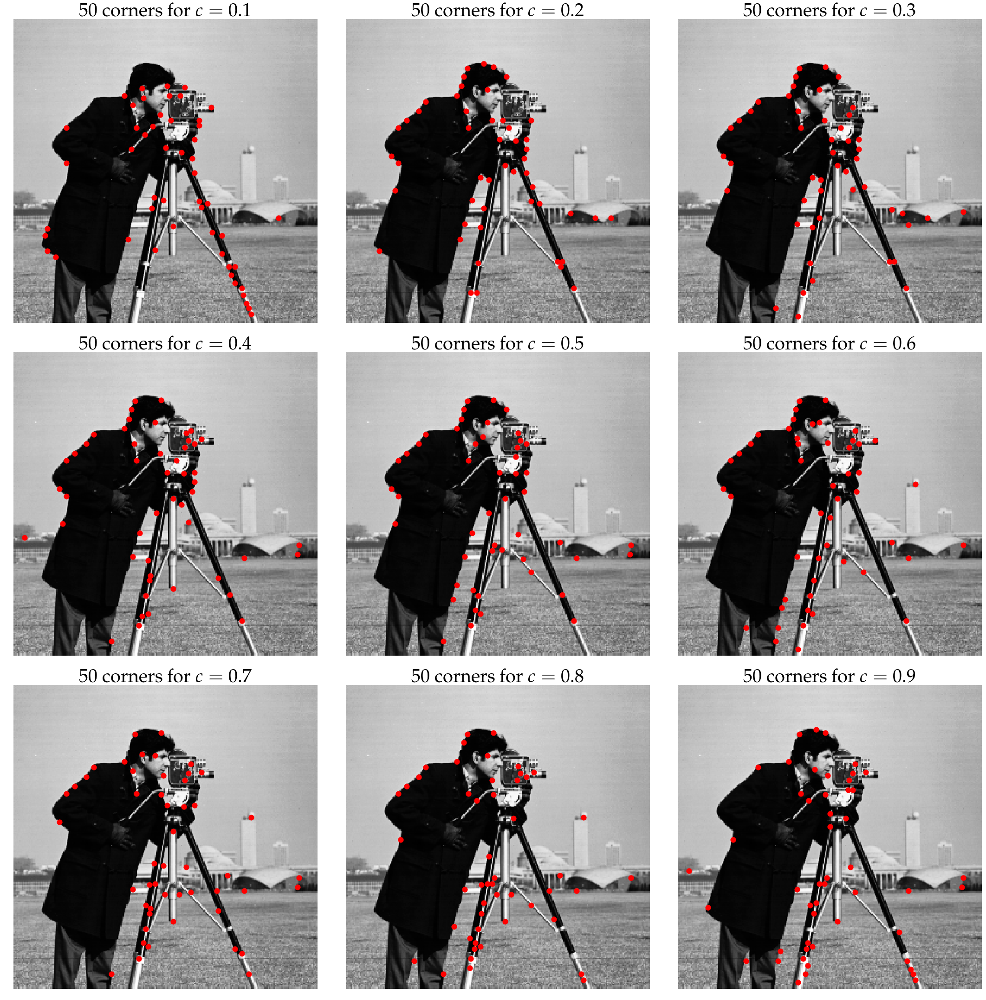

In [291]:
gen_plot_c(cameraman, save_file = "2_cameraman_c")

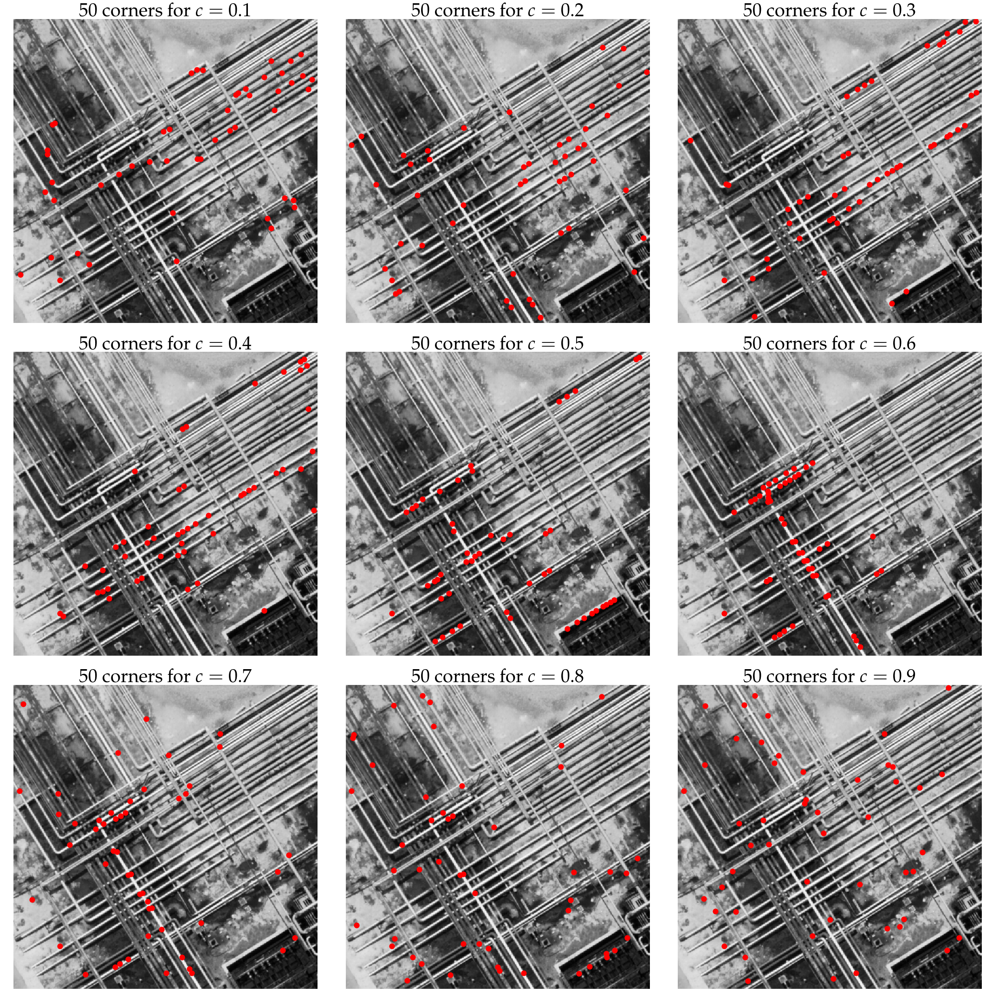

In [292]:
gen_plot_c(bouc, save_file = "2_bouc_c")

## Influence de b

In [288]:
# Constant associated with Harris corner detection
kappa = 0.05
sigma_d = 1
sigma_i = 1

# Local window for local minima
local = 3

# Threshold (in percentage of maximal value) for values to keep  after first step of cleaning
threshold = 0.01

# Constants associated with ANMS
c = 0.7
best = 50

def gen_plot_b(img, save_file = None):
    """
    Given an image, run harris detector points and plot the resulting image
    """
    h = 3
    w = 3
    f, ax = plt.subplots(3, 3, figsize = (30, 30));

    R = 10 * np.arange(1,10)
    for s in range(9):
        corners = find_harris_corners(
        img,
        sigma_d,
        sigma_i,
        kappa,
        threshold,
        local
        )
#         corners = np.argwhere(corners > 0)
        refined_corners = anms(corners, R[s], c)
        ax[s // h][s % w].scatter(refined_corners[:, 1], refined_corners[:, 0], color = 'r', marker= ".", s = 500);
        ax[s // h][s % w].imshow(img, cmap="Greys_r");
        ax[s // h][s % w].axis('off')
        ax[s // h][s % w].set_title(r'{} corners for $b =$ {:1}'.format(len(refined_corners), R[s]),
                                   fontsize = 40)
    f.tight_layout();
    if save_file:
        f.savefig("images/" + save_file + ".png")


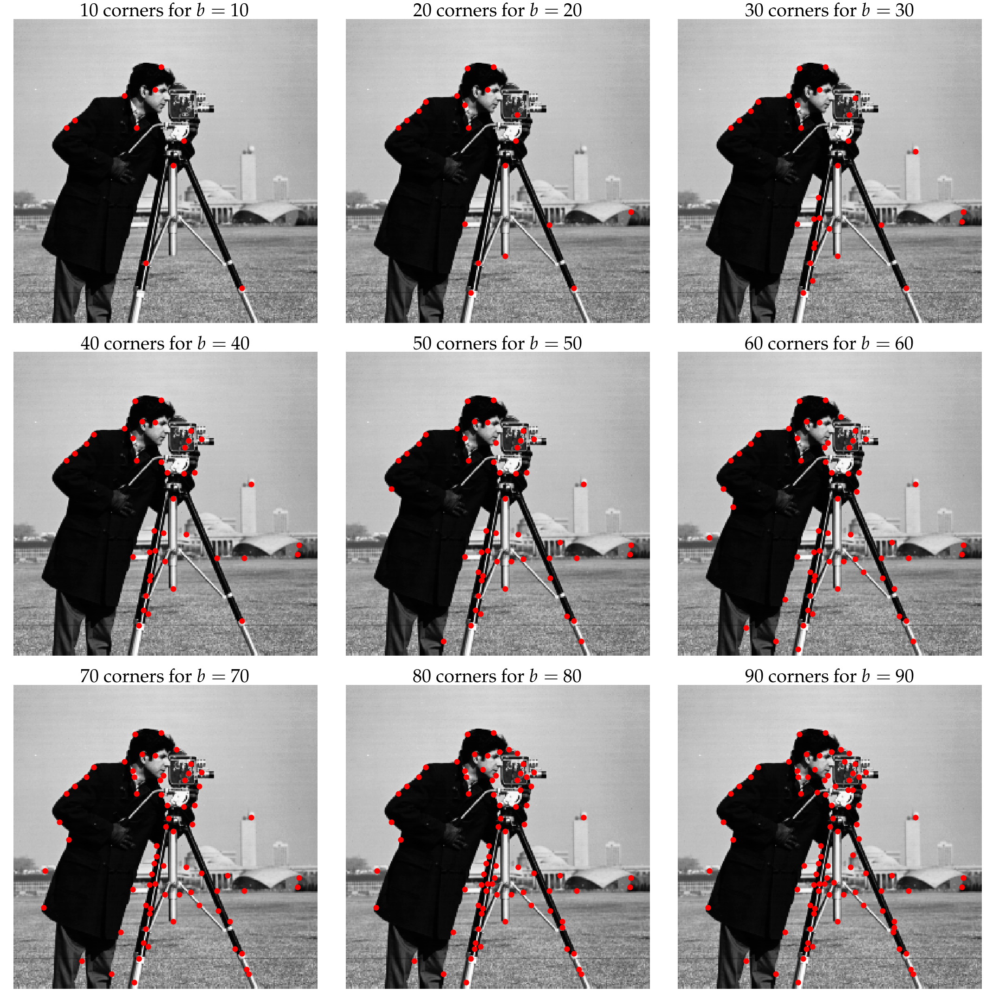

In [289]:
gen_plot_b(cameraman, save_file = "2_cameraman_b")